<a href="https://colab.research.google.com/github/yebiny/SkillTreePython-DeepLearning/blob/main/04.Paper-with-code/ch04_01_UNet_Image_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ch04.01 UNet-Image segmentation

* 날짜:
* 이름:

## 학습내용
    - Image segmentation에 대해 이해한다.
    - UNet 모델에 대해 이해한다.
    - 이미지 분절 작업을 수행한다.

## Image Segmentation

![](https://github.com/yebiny/Image-Segmentation-TF2/blob/main/imgs/seg_type.png?raw=true)


![](https://github.com/yebiny/Image-Segmentation-TF2/blob/main/imgs/seg_model.png?raw=true)

## 모델: UNet
---

![]( https://github.com/yebiny/Image-Segmentation-TF2/blob/main/imgs/unet2.png?raw=true)

#### **레포지토리 임포트**

https://github.com/karolzak/keras-unet

```
! git clone https://github.com/karolzak/keras-unet
```


In [ ]:
! git clone https://github.com/karolzak/keras-unet

Cloning into 'keras-unet'...
remote: Enumerating objects: 1234, done.
remote: Counting objects: 100% (98/98), done.
remote: Compressing objects: 100% (58/58), done.
remote: Total 1234 (delta 44), reused 75 (delta 34), pack-reused 1136
Receiving objects: 100% (1234/1234), 31.94 MiB | 12.57 MiB/s, done.
Resolving deltas: 100% (372/372), done.


In [ ]:
import sys, os, glob
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import utils, callbacks
sys.path.append('/content/keras-unet')

#### **모델 생성**

In [ ]:
from keras_unet.models import vanilla_unet

model = vanilla_unet(input_shape=(572, 572, 3))
model.summary()

In [ ]:
utils.plot_model(model, show_shapes = True)

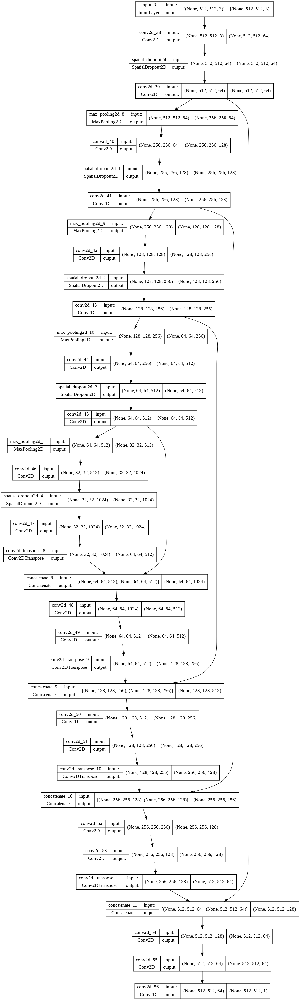

In [ ]:
from keras_unet.models import custom_unet

model = custom_unet(
    input_shape=(512, 512, 3),
    use_batch_norm=False,
    num_classes=1,
    filters=64,
    dropout=0.2,
    output_activation='sigmoid')

utils.plot_model(model, show_shapes = True)

## 데이터셋: Whale-tails
---

### **| 데이터 처리**

#### **데이터 경로 확보**

In [ ]:
img_paths = glob.glob('/content/keras-unet/input/whales/*jpg')
mask_paths = glob.glob('/content/keras-unet/input/whales/*png')
print(len(img_paths), img_paths[0])
print(len(mask_paths), mask_paths[0])

500 /content/keras-unet/input/whales/00d641885.jpg
148 /content/keras-unet/input/whales/00e4afee9.png


In [ ]:
img_paths = [mask_path.replace('png', 'jpg') for mask_path in mask_paths]
print(len(img_paths), img_paths[0])

148 /content/keras-unet/input/whales/00e4afee9.jpg


#### **넘파이 변환**

In [ ]:
from PIL import Image
imgs = []
masks = []
for img_path, mask_path in zip(img_paths, mask_paths):
  # path2img
  img = Image.open(img_path).resize( (384,384) )
  img = np.array(img)
  imgs.append(img)

  #path2mask
  mask = Image.open(mask_path).resize( (384,384) )
  mask = np.array(mask)
  masks.append(mask)
imgs = np.asarray(imgs)
masks = np.asarray(masks)
masks = np.expand_dims(masks, 3)

imgs.shape, masks.shape

((148, 384, 384, 3), (148, 384, 384, 1))

#### **데이터 확인**

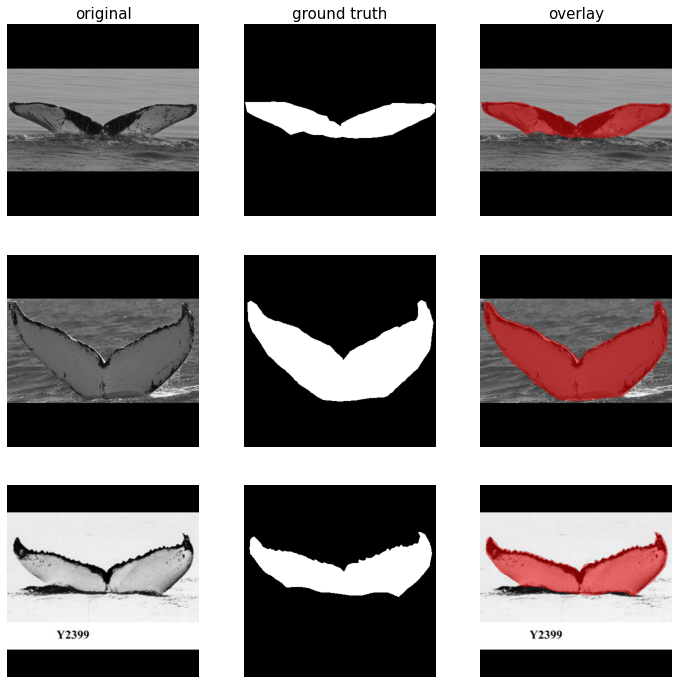

In [ ]:
from keras_unet.utils import plot_imgs
plot_imgs(imgs, masks, nm_img_to_plot = 3)

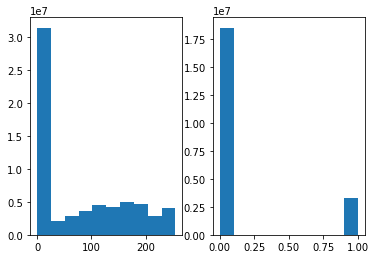

In [ ]:
plt.subplot(121); _=plt.hist(imgs.flatten())
plt.subplot(122); _=plt.hist(masks.flatten())

In [ ]:
mn, mx = np.min(imgs.flatten()), np.max(img.flatten())
print(f'인풋 이미지의 값 범위: {mn}, {mx}')
print(f'마스크의 값 범위: {set(mask.flatten() )}')

인풋 이미지의 값 범위: 0, 255
마스크의 값 범위: {0, 1}


#### **전처리**

In [ ]:
def whale_preprocess(imgs, masks):
  imgs = imgs/255
  return imgs, masks

인풋 이미지의 값 범위: 0.0, 1.0
마스크의 값 범위: {0, 1}


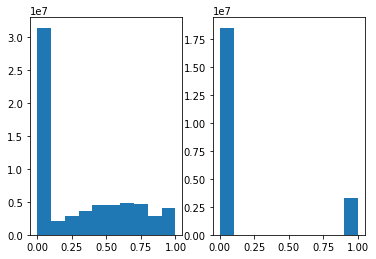

In [ ]:
imgs_ds, masks_ds = whale_preprocess(imgs, masks)
mn, mx = np.min(imgs_ds.flatten()), np.max(imgs_ds.flatten())
print(f'인풋 이미지의 값 범위: {mn}, {mx}')
print(f'마스크의 값 범위: {set(masks_ds.flatten() )}')
plt.subplot(121); _=plt.hist(imgs_ds.flatten())
plt.subplot(122); _=plt.hist(masks_ds.flatten())

In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(imgs_ds, masks_ds,
                                                    test_size = 0.1, random_state = 0)
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((133, 384, 384, 3), (15, 384, 384, 3), (133, 384, 384, 1), (15, 384, 384, 1))

#### **이미지 증강**

In [ ]:
from keras_unet.utils import get_augmented

train_gen = get_augmented(x_train, y_train,
                          batch_size = 2,
                          data_gen_args=dict(rotation_range = 5.0,
                                            height_shift_range = 0.05,
                                            width_shift_range = 0.05,
                                            shear_range = 40,
                                            horizontal_flip = True,
                                            vertical_flip = False,
                                            fill_mode = 'constant'))

(2, 384, 384, 3) (2, 384, 384, 1)


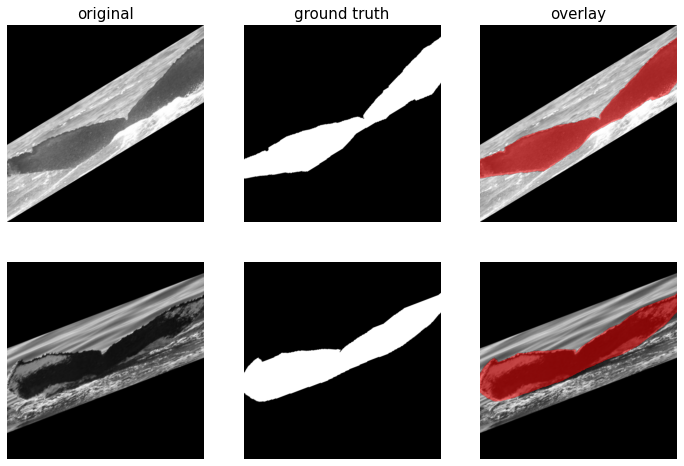

In [ ]:
samples = next(train_gen)
xs, ys = samples
print(xs.shape, ys.shape)
plot_imgs(xs, ys, nm_img_to_plot = 2)

### **| 모델 생성 및 학습**

#### **모델 생성**

In [ ]:
model = custom_unet((384,384,3),
                    filters = 32, output_activation='sigmoid')
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 384, 384, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_76 (Conv2D)             (None, 384, 384, 32  864         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_18 (BatchN  (None, 384, 384, 32  128        ['conv2d_76[0][0]']              
 ormalization)                  )                                                           

#### **컴파일 및 학습**

In [ ]:
# 콜백_체크포인트
ckp = callbacks.ModelCheckpoint('unet_whale.h5',
                                monitor = 'val_loss',
                                save_best_only = True)

In [ ]:
from keras_unet.metrics import iou

model.compile(optimizer = 'adam',
              loss = 'binary_crossentropy',
              metrics = [ iou ]) # 케라스에서 iou 함수 지원X

In [ ]:
history = model.fit(train_gen,
                    epochs = 50,
                    steps_per_epoch = 200,
                    validation_data = (x_test, y_test),
                    callbacks = [ckp])

Epoch 1/50
200/200 [==============================] - 20s 87ms/step - loss: 0.1013 - iou: 0.7225 - val_loss: 0.0742 - val_iou: 0.7845
Epoch 2/50
200/200 [==============================] - 16s 79ms/step - loss: 0.1184 - iou: 0.6763 - val_loss: 0.1308 - val_iou: 0.7465
Epoch 3/50
200/200 [==============================] - 16s 80ms/step - loss: 0.0848 - iou: 0.7431 - val_loss: 0.1786 - val_iou: 0.7566
Epoch 4/50
200/200 [==============================] - 16s 80ms/step - loss: 0.0978 - iou: 0.7201 - val_loss: 0.1064 - val_iou: 0.6761
Epoch 5/50
200/200 [==============================] - 16s 80ms/step - loss: 0.0839 - iou: 0.7421 - val_loss: 0.0676 - val_iou: 0.8060
Epoch 6/50
200/200 [==============================] - 16s 81ms/step - loss: 0.0775 - iou: 0.7567 - val_loss: 0.0617 - val_iou: 0.8331
Epoch 7/50
200/200 [==============================] - 16s 79ms/step - loss: 0.0996 - iou: 0.7182 - val_loss: 0.0679 - val_iou: 0.7880
Epoch 8/50
200/200 [==============================] - 16s 81ms

#### **Plot training history**

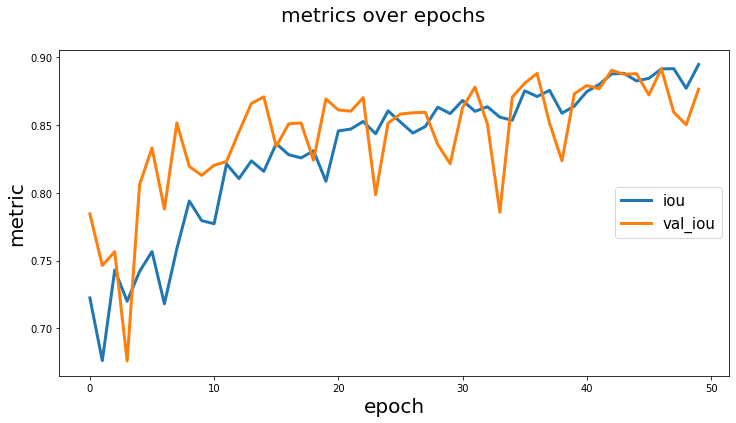

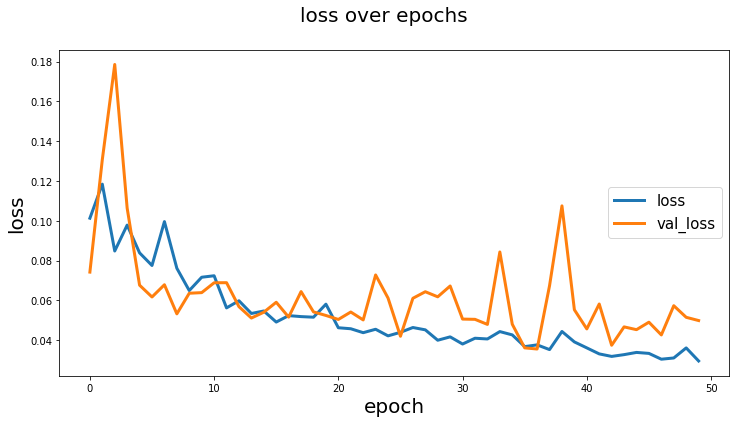

In [ ]:
from keras_unet.utils import plot_segm_history

plot_segm_history(
    history, metrics = ['iou', 'val_iou'],
    losses = ['loss', 'val_loss'])

#### **Plot original + ground truth + pred + overlay (pred on top of original)**

In [ ]:
y_pred = model.predict(x_test)
print(y_test.shape, y_pred.shape)

(15, 384, 384, 1) (15, 384, 384, 1)


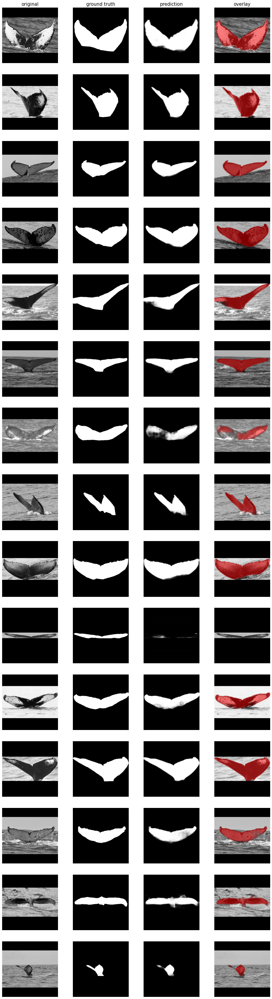

In [ ]:
plot_imgs(org_imgs = x_test,
          mask_imgs = y_test,
          pred_imgs = y_pred,
          nm_img_to_plot = 15)

## 데이터셋: kz-isbi-challenge
---

https://github.com/karolzak/keras-unet/blob/master/notebooks/kz-isbi-challenge.ipynb

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import glob
import os
import sys
from PIL import Image

In [ ]:
masks = glob.glob("/content/keras-unet/input/isbi2015/train/label/*.png")
orgs = glob.glob("/content/keras-unet/input/isbi2015/train/image/*.png")

In [ ]:
imgs_list = []
masks_list = []
for image, mask in zip(orgs, masks):
    imgs_list.append(np.array(Image.open(image).resize((512,512))))
    
    im = Image.open(mask).resize((512,512))
    #width, height = im.size   # Get dimensions

    #left = (width - 388)/2
    #top = (height - 388)/2
    #right = (width + 388)/2
    #bottom = (height + 388)/2

    #im_cropped = im.crop((left, top, right, bottom))
    masks_list.append(np.array(im))

imgs_np = np.asarray(imgs_list)
masks_np = np.asarray(masks_list)

In [ ]:
print(imgs_np.shape, masks_np.shape)

(30, 512, 512) (30, 512, 512)


-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

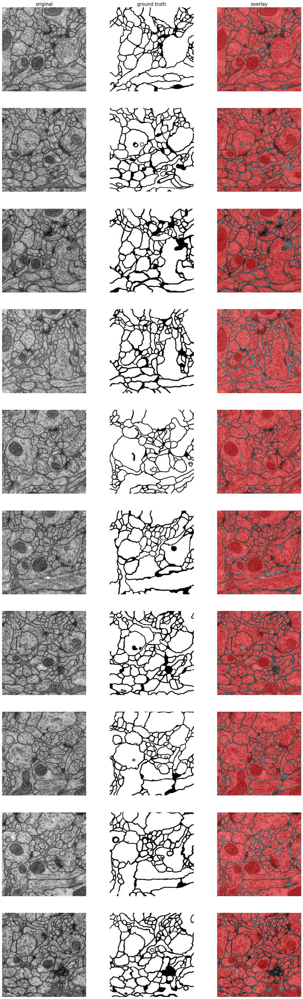

In [ ]:
from keras_unet.utils import plot_imgs

plot_imgs(org_imgs=imgs_np, mask_imgs=masks_np, nm_img_to_plot=10, figsize=6)

In [ ]:
# 이미지의 최대 값 (0~255 사이의 값을 가짐)
print(imgs_np.max(), masks_np.max())

255 255


### 이미지 전처리

In [ ]:
# 전처리
x = np.asarray(imgs_np, dtype=np.float32)/255
y = np.asarray(masks_np, dtype=np.float32)/255

In [ ]:
# 전처리 이후 값이 0~1사이의 값으로 스케일링 됨
print(x.max(), y.max())

1.0 1.0


In [ ]:
print(x.shape, y.shape)

(30, 512, 512) (30, 512, 512)


In [ ]:
y = y.reshape(y.shape[0], y.shape[1], y.shape[2], 1)
print(x.shape, y.shape)

(30, 512, 512) (30, 512, 512, 1)


In [ ]:
x = x.reshape(x.shape[0], x.shape[1], x.shape[2], 1)
print(x.shape, y.shape)

(30, 512, 512, 1) (30, 512, 512, 1)


### train, test셋 분할

In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x, y, test_size=0.5, random_state=0)

print("x_train: ", x_train.shape)
print("y_train: ", y_train.shape)
print("x_val: ", x_val.shape)
print("y_val: ", y_val.shape)

x_train:  (15, 512, 512, 1)
y_train:  (15, 512, 512, 1)
x_val:  (15, 512, 512, 1)
y_val:  (15, 512, 512, 1)


### 증강

In [ ]:
from keras_unet.utils import get_augmented

train_gen = get_augmented(
    x_train, y_train, batch_size=2,
    data_gen_args = dict(
        rotation_range=15.,
        width_shift_range=0.05,
        height_shift_range=0.05,
        shear_range=50,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode='constant'
    ))

(2, 512, 512, 1) (2, 512, 512, 1)


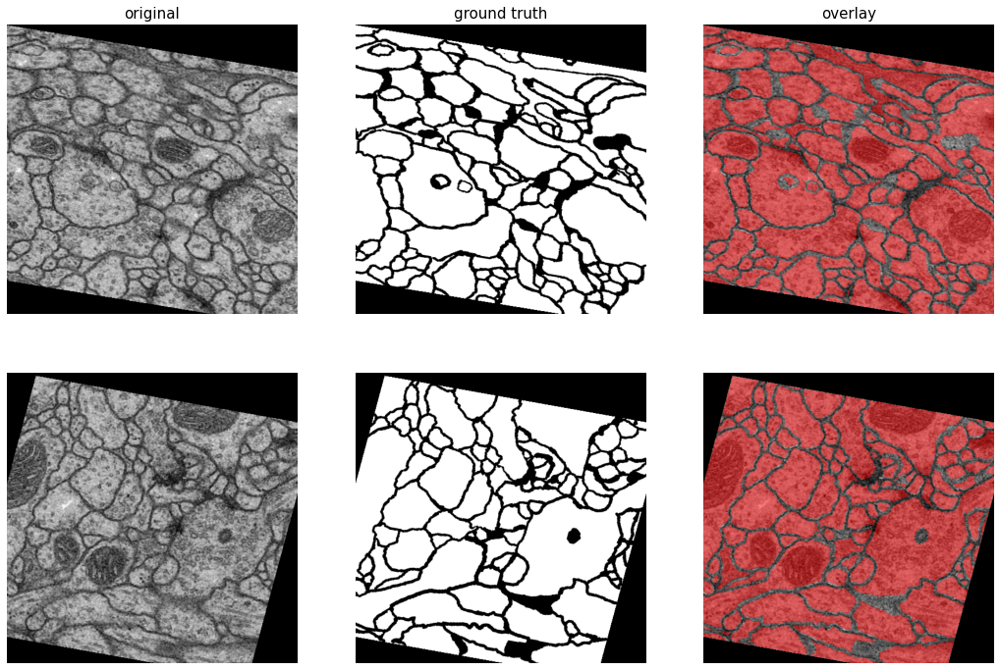

In [ ]:
sample_batch = next(train_gen)
xx, yy = sample_batch
print(xx.shape, yy.shape)
from keras_unet.utils import plot_imgs

plot_imgs(org_imgs=xx, mask_imgs=yy, nm_img_to_plot=2, figsize=6)

### 모델링

In [ ]:
# 초기 모델
from keras_unet.models import custom_unet

input_shape = x_train[0].shape

model = custom_unet(
    input_shape,
    use_batch_norm=False,
    num_classes=1,
    filters=64,
    dropout=0.2,
    output_activation='sigmoid'
)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 64  640         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 spatial_dropout2d (SpatialDrop  (None, 512, 512, 64  0          ['conv2d[0][0]']                 
 out2D)                         )                                                             

In [ ]:
from keras.callbacks import ModelCheckpoint

# 체크포인트 추가
model_filename = 'segm_model_v0.h5'
callback_checkpoint = ModelCheckpoint(
    model_filename, 
    verbose=1, 
    monitor='val_loss', 
    save_best_only=True,)

In [ ]:
from tensorflow.keras.optimizers import Adam, SGD
from keras_unet.metrics import iou, iou_thresholded
from keras_unet.losses import jaccard_distance

model.compile(
    #optimizer=Adam(), 
    optimizer=SGD(lr=0.01, momentum=0.99),
    loss='binary_crossentropy',
    #loss=jaccard_distance,
    metrics=[iou, iou_thresholded]
)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


In [ ]:
history = model.fit_generator(
    train_gen,
    steps_per_epoch=100,
    epochs=10,
    
    validation_data=(x_val, y_val),
    callbacks=[callback_checkpoint]
)

Epoch 1/10


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  import sys


100/100 [==============================] - ETA: 0s - loss: 0.4398 - iou: 0.6645 - iou_thresholded: 0.7585
Epoch 1: val_loss improved from inf to 0.36578, saving model to segm_model_v0.h5
100/100 [==============================] - 45s 305ms/step - loss: 0.4398 - iou: 0.6645 - iou_thresholded: 0.7585 - val_loss: 0.3658 - val_iou: 0.7189 - val_iou_thresholded: 0.8045
Epoch 2/10
100/100 [==============================] - ETA: 0s - loss: 0.3837 - iou: 0.7169 - iou_thresholded: 0.7632
Epoch 2: val_loss did not improve from 0.36578
100/100 [==============================] - 21s 214ms/step - loss: 0.3837 - iou: 0.7169 - iou_thresholded: 0.7632 - val_loss: 0.4201 - val_iou: 0.6583 - val_iou_thresholded: 0.7356
Epoch 3/10
100/100 [==============================] - ETA: 0s - loss: 0.3438 - iou: 0.7230 - iou_thresholded: 0.7781
Epoch 3: val_loss improved from 0.36578 to 0.36290, saving model to segm_model_v0.h5
100/100 [==============================] - 22s 220ms/step - loss: 0.3438 - iou: 0.7230 

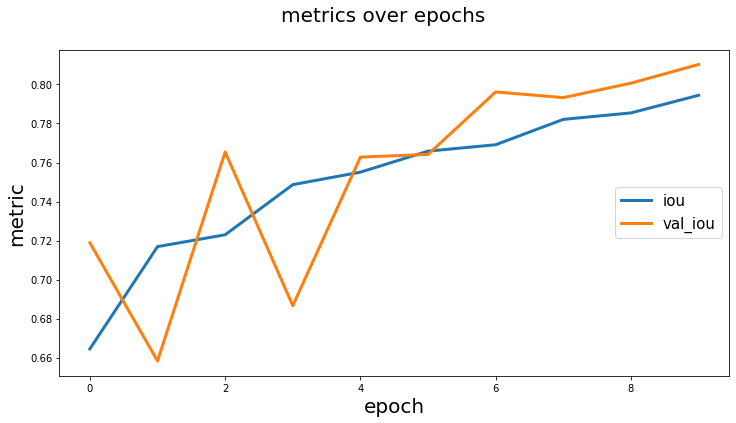

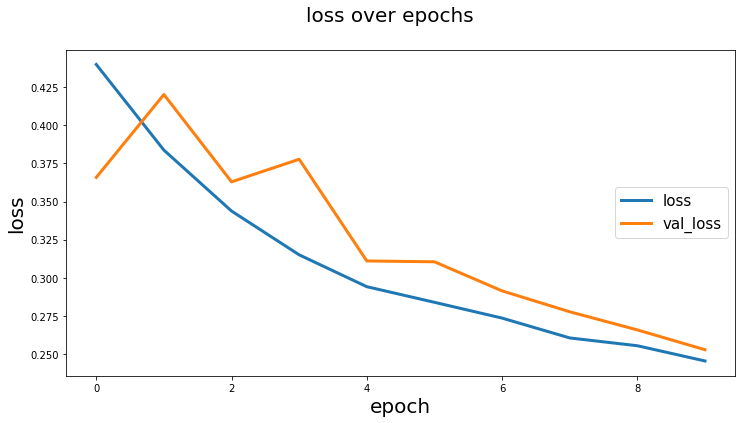

In [ ]:
from keras_unet.utils import plot_segm_history

plot_segm_history(history)

### 예측결과 이미지로 확인

In [ ]:
model.load_weights(model_filename)
y_pred = model.predict(x_val)

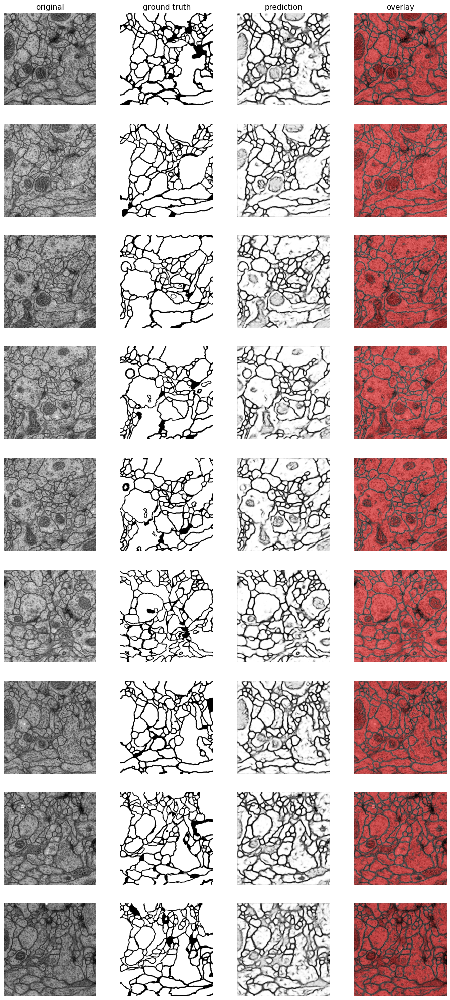

In [ ]:
from keras_unet.utils import plot_imgs

plot_imgs(org_imgs=x_val, mask_imgs=y_val, pred_imgs=y_pred, nm_img_to_plot=9)